# SARS-Cov-2 Infection Dynamics

Install Packages

In [ ]:
!pip install scanpy
!pip install anndata
!pip3 install igraph
!pip install celltypist
!pip install decoupler
!pip install fa2-modified
!pip install louvain
!pip install scvelo

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.1/2.1 MB 23.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 172.3/172.3 kB 8.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 58.2/58.2 kB 3.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 284.1/284.1 kB 10.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 9.2/9.2 MB 56.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 5.7/5.7 MB 61.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 45.1/45.1 kB 2.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.3/7.3 MB 69.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.7/2.7 MB 71.2 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 62.0/62.0 kB 3.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 120.9/120.9 kB 8.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 37.3/37.3 MB 17.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━

Load Data

In [ ]:
import scanpy as sc
import anndata as ad
import numpy as np
import scvelo as scv

In [ ]:
import tarfile
import os
import re

archive_path = '/content/GSE166766_RAW.tar'
extraction_dir = '/content/extracted_data'

# Download the tar file (will overwrite if it exists, ensuring a fresh copy)
print(f"Downloading {archive_path}...")
!wget -O {archive_path} ftp://ftp.ncbi.nlm.nih.gov/geo/series/GSE166nnn/GSE166766/suppl/GSE166766_RAW.tar
print("Download complete.")

# Create the extraction directory if it doesn't exist
os.makedirs(extraction_dir, exist_ok=True)

# Extract the tar file
with tarfile.open(archive_path, 'r') as tar_ref:
    tar_ref.extractall(extraction_dir)

# List the contents of the extraction directory to see the structure
print(f"Contents of {extraction_dir}: {os.listdir(extraction_dir)}")

# Identify unique prefixes for each 10x dataset
file_list = os.listdir(extraction_dir)
matrix_files = [f for f in file_list if f.endswith('_matrix.mtx.gz')]

# Extract prefixes, e.g., 'GSM5082290_1dpi'
# Use a regex to be more robust, or simply string replacement
prefixes = sorted(list(set(f.replace('_matrix.mtx.gz', '') for f in matrix_files)))

# Dictionary to store AnnData objects for each sample
adata_dict = {}

for p in prefixes:
    print(f"Reading data for prefix: {p}")
    # The prefix argument for sc.read_10x_mtx expects the full prefix including '_' if present
    current_adata = sc.read_10x_mtx(extraction_dir, prefix=f'{p}_')
    current_adata.var_names_make_unique()
    adata_dict[p] = current_adata

# Now `adata_dict` contains AnnData objects for each sample, keyed by their prefix.
# For example, to access the '1dpi' data: adata_dict['GSM5082290_1dpi']
# You can choose one of these or concatenate them later if needed.

# If you need a single AnnData object, you might concatenate them.
# For example, let's just assign one of them to `esc_adata` for now
# or you can concatenate all if appropriate for your analysis.
if 'GSM5082290_1dpi' in adata_dict:
    esc_adata = adata_dict['GSM5082290_1dpi']
    print("Assigned 'GSM5082290_1dpi' to esc_adata as an example.")
else:
    # Fallback if specific key not found, or handle concatenation
    print("Consider concatenating AnnData objects if a single one is required.")

--2025-12-08 15:44:28--  ftp://ftp.ncbi.nlm.nih.gov/geo/series/GSE166nnn/GSE166766/suppl/GSE166766_RAW.tar
           => ‘/content/GSE166766_RAW.tar’
Resolving ftp.ncbi.nlm.nih.gov (ftp.ncbi.nlm.nih.gov)... 130.14.250.7, 130.14.250.10, 130.14.250.11, ...
Connecting to ftp.ncbi.nlm.nih.gov (ftp.ncbi.nlm.nih.gov)|130.14.250.7|:21... connected.
Logging in as anonymous ... Logged in!
==> SYST ... done.    ==> PWD ... done.
==> TYPE I ... done.  ==> CWD (1) /geo/series/GSE166nnn/GSE166766/suppl ... done.
==> SIZE GSE166766_RAW.tar ... 838123520
==> PASV ... done.    ==> RETR GSE166766_RAW.tar ... done.
Length: 838123520 (799M) (unauthoritative)

GSE166766_RAW.tar   100%[===================>] 799.30M  36.9MB/s    in 13s     

2025-12-08 15:44:41 (62.5 MB/s) - ‘/content/GSE166766_RAW.tar’ saved [838123520]

Download complete.
Contents of /content/extracted_data: ['GSM5082290_1dpi_matrix.mtx.gz', 'GSM5082289_mock_features.tsv.gz', 'GSM5082292_3dpi_barcodes.tsv.gz', 'GSM5082292_3dpi_features.ts

In [ ]:
!pwd

/content


In [ ]:
# Access datasets from the already loaded adata_dict
mock_adata = adata_dict['GSM5082289_mock']
day_one = adata_dict['GSM5082290_1dpi']
day_two = adata_dict['GSM5082291_2dpi']
day_three = adata_dict['GSM5082292_3dpi']

print("All datasets loaded successfully from adata_dict.")

All datasets loaded successfully from adata_dict.


In [ ]:
mock_adata.obs['condition'] = 'mock'
day_one.obs['condition'] = 'one'
day_two.obs['condition'] = 'two'
day_three.obs['condition'] = 'three'

In [ ]:
print(mock_adata)
print(day_one)
print(day_two)
print(day_three)

AnnData object with n_obs × n_vars = 22609 × 33539
    obs: 'condition'
    var: 'gene_ids', 'feature_types'
AnnData object with n_obs × n_vars = 11834 × 33539
    obs: 'condition'
    var: 'gene_ids', 'feature_types'
AnnData object with n_obs × n_vars = 14695 × 33539
    obs: 'condition'
    var: 'gene_ids', 'feature_types'
AnnData object with n_obs × n_vars = 28530 × 33539
    obs: 'condition'
    var: 'gene_ids', 'feature_types'


In [ ]:
adata_list = [mock_adata, day_one, day_two, day_three]
adata = ad.concat(adata_list)

In [ ]:
adata

AnnData object with n_obs × n_vars = 77668 × 33539
    obs: 'condition'

In [ ]:
adata.var.head()

""
MIR1302-2HG
FAM138A
OR4F5
AL627309.1
AL627309.3


Quality Control

In [ ]:
#mock
mock_adata.var['MT'] = mock_adata.var_names.str.startswith(("MT-"))
mock_adata.var['RIBO'] = mock_adata.var_names.str.startswith(("RPS","RPL"))
mock_adata.var['HB'] = mock_adata.var_names.str.startswith(("HB[^(p)]"))

#day1
day_one.var['MT'] = day_one.var_names.str.startswith(("MT-"))
day_one.var['RIBO'] = day_one.var_names.str.startswith(("RPS","RPL"))
day_one.var['HB'] = day_one.var_names.str.startswith(("HB[^(p)]"))

#day2
day_two.var['MT'] = day_two.var_names.str.startswith(("MT-"))
day_two.var['RIBO'] = day_two.var_names.str.startswith(("RPS","RPL"))
day_two.var['HB'] = day_two.var_names.str.startswith(("HB[^(p)]"))

#day3
day_three.var['MT'] = day_three.var_names.str.startswith(("MT-"))
day_three.var['RIBO'] = day_three.var_names.str.startswith(("RPS","RPL"))
day_three.var['HB'] = day_three.var_names.str.startswith(("HB[^(p)]"))

In [ ]:
#mock
sc.pp.calculate_qc_metrics(
    mock_adata, qc_vars=['MT','RIBO','HB'], log1p=True, inplace=True
)

#day1
sc.pp.calculate_qc_metrics(
    day_one, qc_vars=['MT','RIBO','HB'], log1p=True, inplace=True
)

#day2
sc.pp.calculate_qc_metrics(
    day_two, qc_vars=['MT','RIBO','HB'], log1p=True, inplace=True
)

#day3
sc.pp.calculate_qc_metrics(
    day_three, qc_vars=['MT','RIBO','HB'], log1p=True, inplace=True
)

In [ ]:
import matplotlib.pyplot as plt

plt.rcParams["figure.figsize"] = (5,4)  # Adjust figure size
plt.rcParams["axes.grid"] = True  # Add grid to plots
plt.rcParams["axes.edgecolor"] = "black" # Set plot border color
plt.rcParams["axes.linewidth"] = 1.5 # Set plot border width
plt.rcParams["axes.facecolor"] = "white" # Set background color
plt.rcParams["axes.labelcolor"] = "black" # Set label color
plt.rcParams["xtick.color"] = "black" # Set x-axis tick color
plt.rcParams["ytick.color"] = "black" # Set y-axis tick color
plt.rcParams["text.color"] = "black" # Set text color

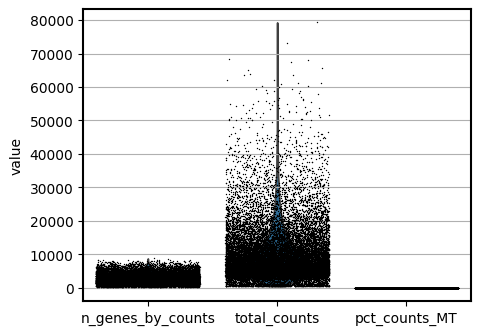

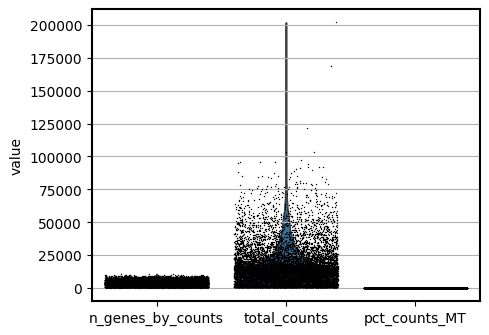

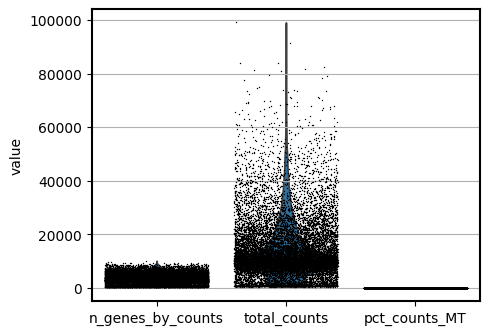

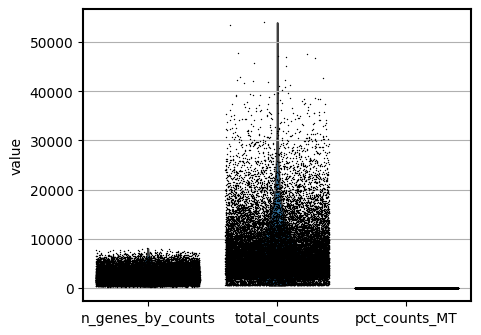

In [ ]:
#mock
sc.pl.violin(
    mock_adata,
    ["n_genes_by_counts", 'total_counts', 'pct_counts_MT'],
    jitter=0.4,
    multi_panel=False,
)

#day1
sc.pl.violin(
    day_one,
    ["n_genes_by_counts", 'total_counts', 'pct_counts_MT'],
    jitter=0.4,
    multi_panel=False,
)

#day2
sc.pl.violin(
    day_two,
    ["n_genes_by_counts", 'total_counts', 'pct_counts_MT'],
    jitter=0.4,
    multi_panel=False,
)

#day3
sc.pl.violin(
    day_three,
    ["n_genes_by_counts", 'total_counts', 'pct_counts_MT'],
    jitter=0.4,
    multi_panel=False,
)

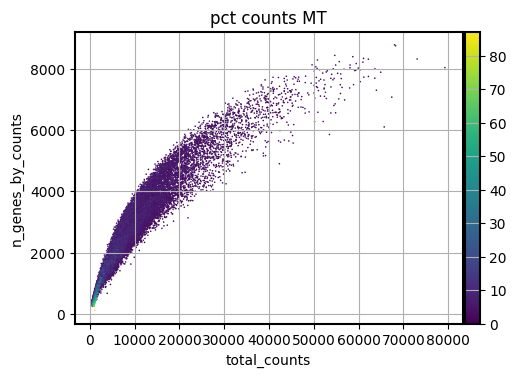

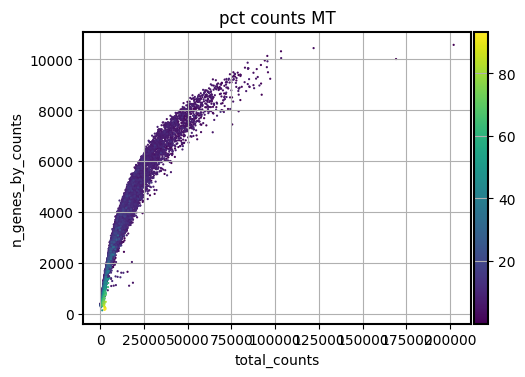

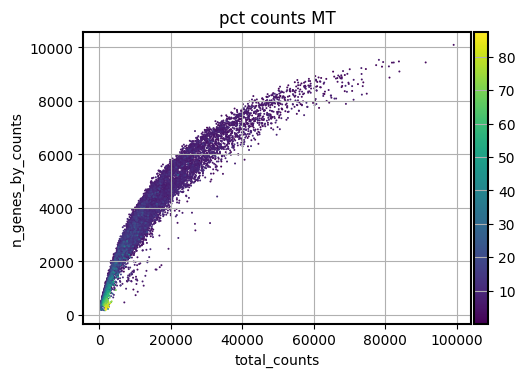

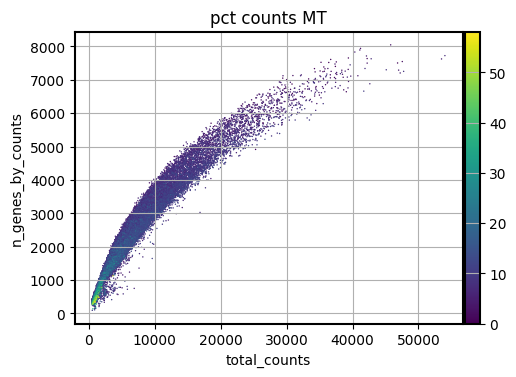

In [ ]:
#mock
sc.pl.scatter(mock_adata, "total_counts", "n_genes_by_counts", color="pct_counts_MT")

#day1
sc.pl.scatter(day_one, "total_counts", "n_genes_by_counts", color="pct_counts_MT")

#day2
sc.pl.scatter(day_two, "total_counts", "n_genes_by_counts", color="pct_counts_MT")

#day3
sc.pl.scatter(day_three, "total_counts", "n_genes_by_counts", color="pct_counts_MT")


In [ ]:
#Normalization
#mock
mock_adata.layers["counts"] = mock_adata.X.copy()
sc.pp.normalize_total(mock_adata)
sc.pp.log1p(mock_adata)

#day1
day_one.layers["counts"] = day_one.X.copy()
sc.pp.normalize_total(day_one)
sc.pp.log1p(day_one)

#day2
day_two.layers["counts"] = day_two.X.copy()
sc.pp.normalize_total(day_two)
sc.pp.log1p(day_two)

#day3
day_three.layers["counts"] = day_three.X.copy()
sc.pp.normalize_total(day_three)
sc.pp.log1p(day_three)

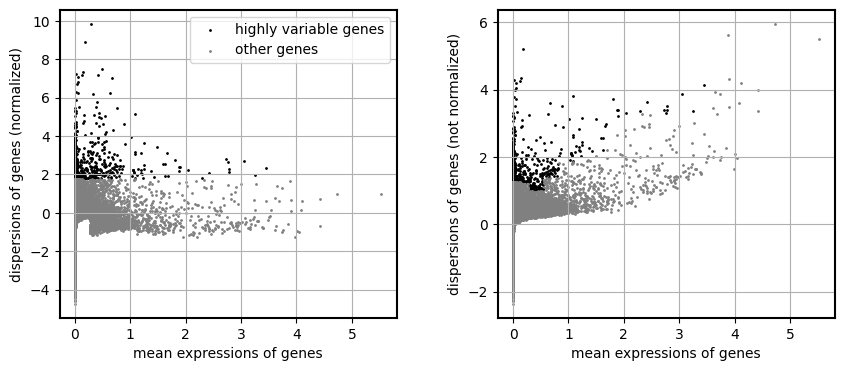

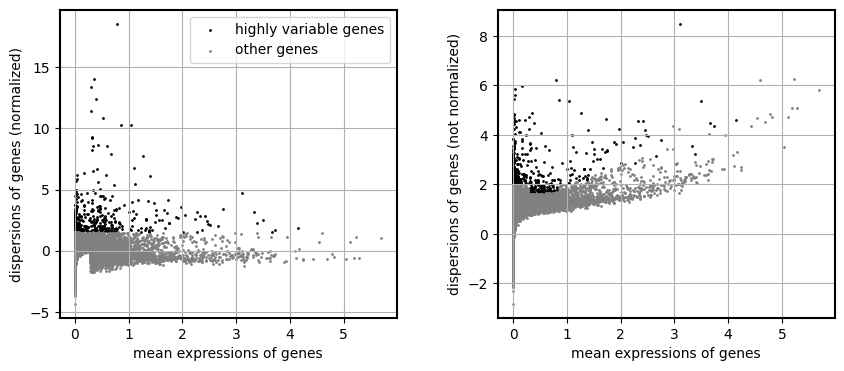

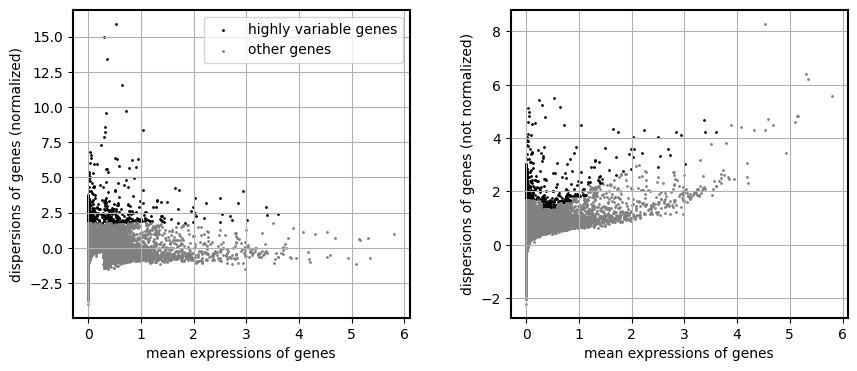

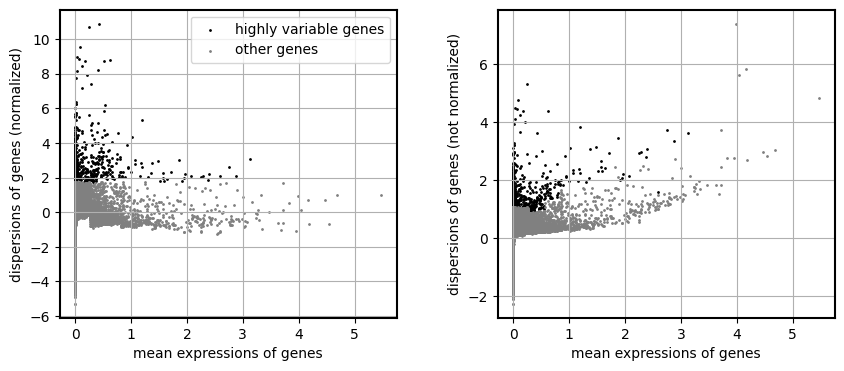

In [ ]:
#Feature selection
sc.pp.highly_variable_genes(mock_adata, n_top_genes=1000)
sc.pp.highly_variable_genes(day_one, n_top_genes=1000)
sc.pp.highly_variable_genes(day_two, n_top_genes=1000)
sc.pp.highly_variable_genes(day_three, n_top_genes=1000)

sc.pl.highly_variable_genes(mock_adata)
sc.pl.highly_variable_genes(day_one)
sc.pl.highly_variable_genes(day_two)
sc.pl.highly_variable_genes(day_three)

Dimensionality Reduction

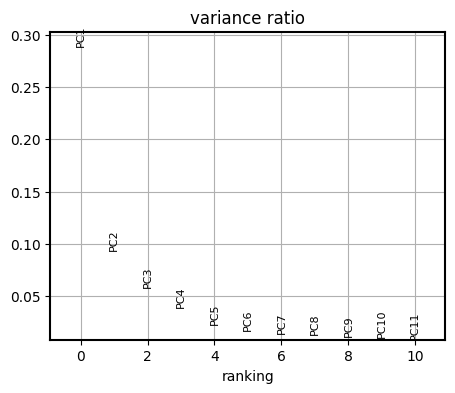

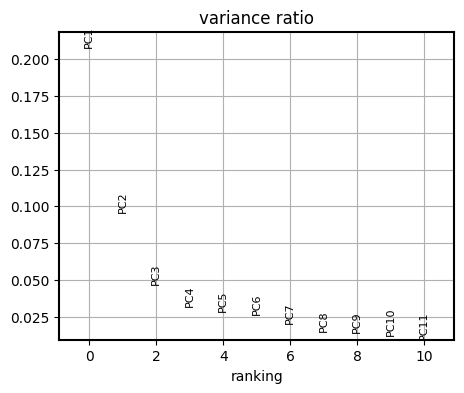

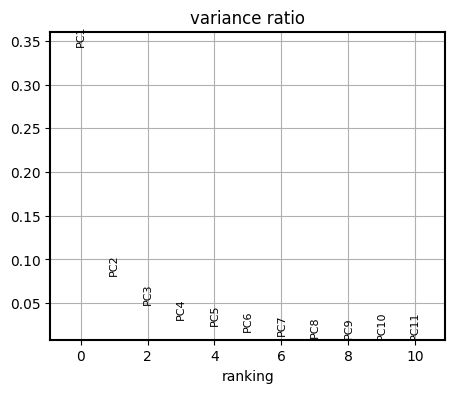

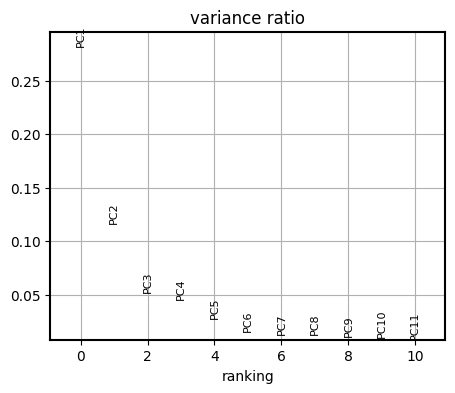

In [ ]:
sc.tl.pca(mock_adata)
sc.tl.pca(day_one)
sc.tl.pca(day_two)
sc.tl.pca(day_three)

sc.pl.pca_variance_ratio(mock_adata, n_pcs=10, log=False)
sc.pl.pca_variance_ratio(day_one, n_pcs=10, log=False)
sc.pl.pca_variance_ratio(day_two, n_pcs=10, log=False)
sc.pl.pca_variance_ratio(day_three, n_pcs=10, log=False)


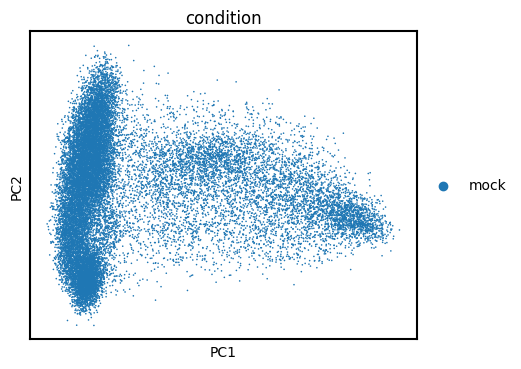

In [ ]:
sc.pl.pca(mock_adata,
          color=['condition'],
          cmap="coolwarm"
)

In [ ]:
#mock
sc.pp.neighbors(mock_adata)
sc.tl.umap(mock_adata)

#day1
sc.pp.neighbors(day_one)
sc.tl.umap(day_one)

#day2
sc.pp.neighbors(day_two)
sc.tl.umap(day_two)

#day3
sc.pp.neighbors(day_three)
sc.tl.umap(day_three)

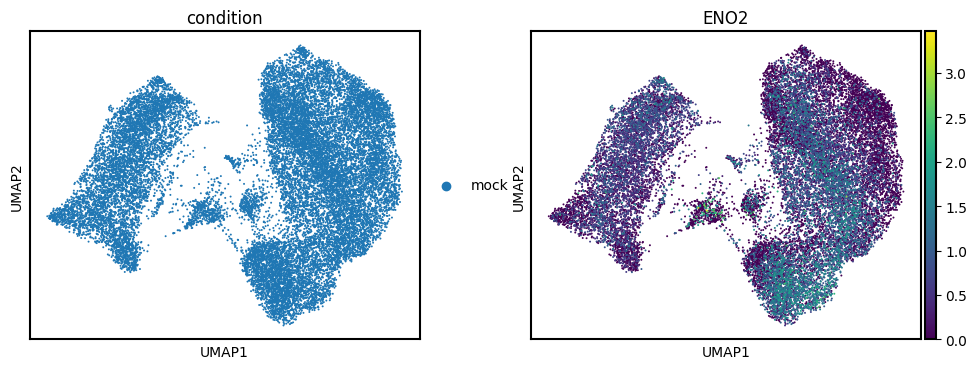

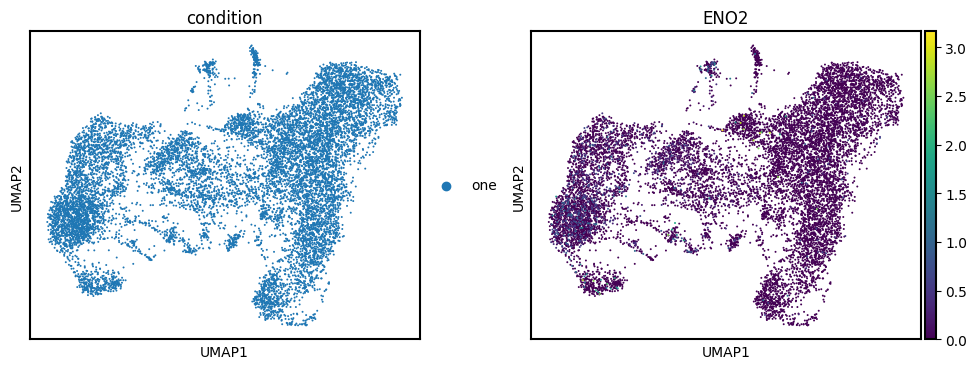

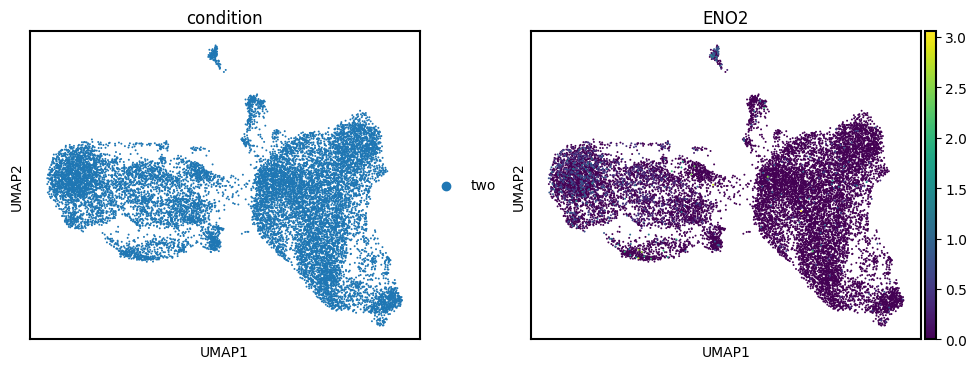

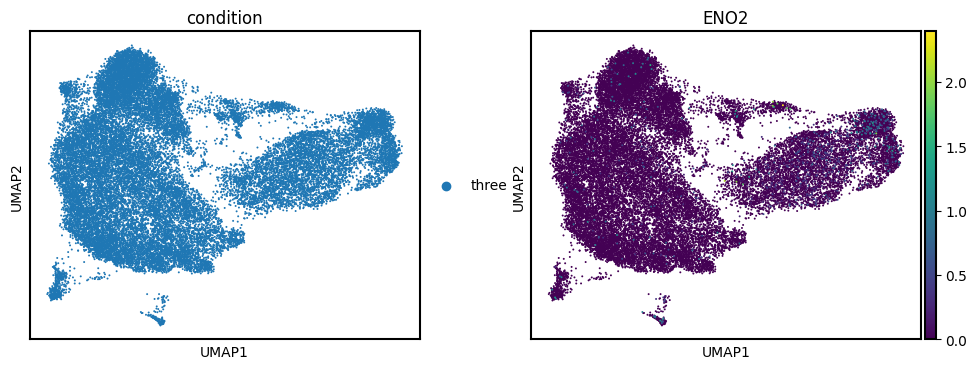

In [ ]:
sc.pl.umap(mock_adata, color=['condition', 'ENO2'], size=8)
sc.pl.umap(day_one, color=['condition', 'ENO2'], size=8)
sc.pl.umap(day_two, color=['condition', 'ENO2'], size=8)
sc.pl.umap(day_three, color=['condition', 'ENO2'], size=8)


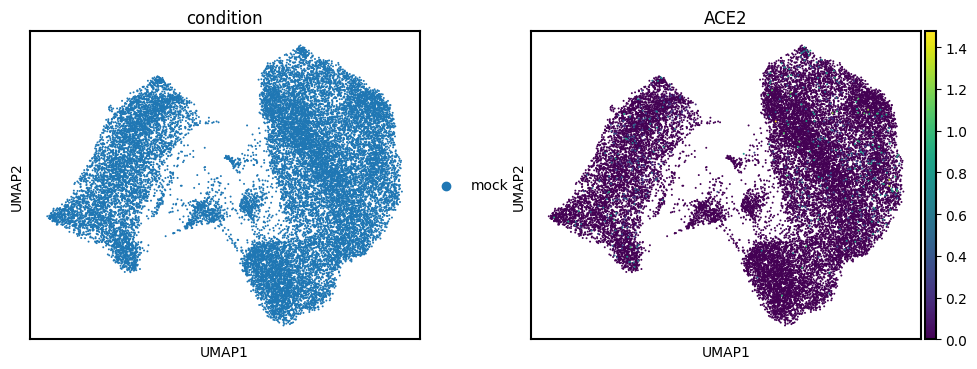

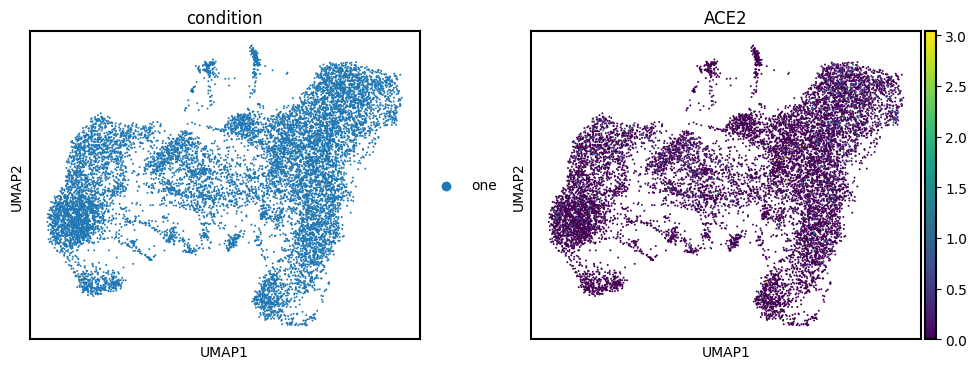

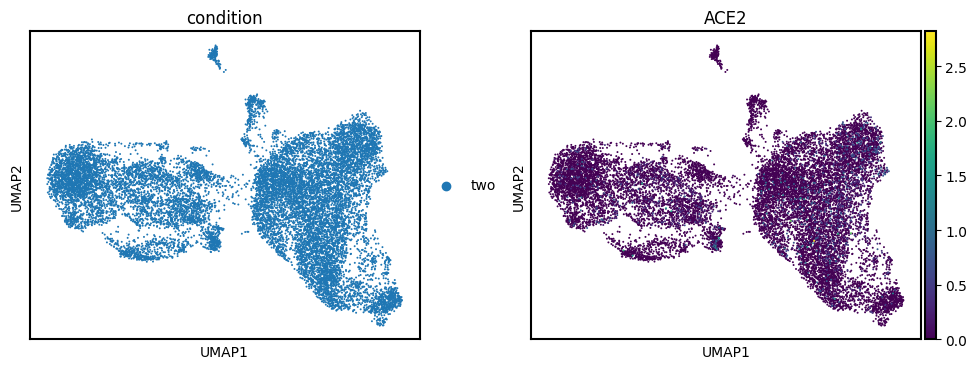

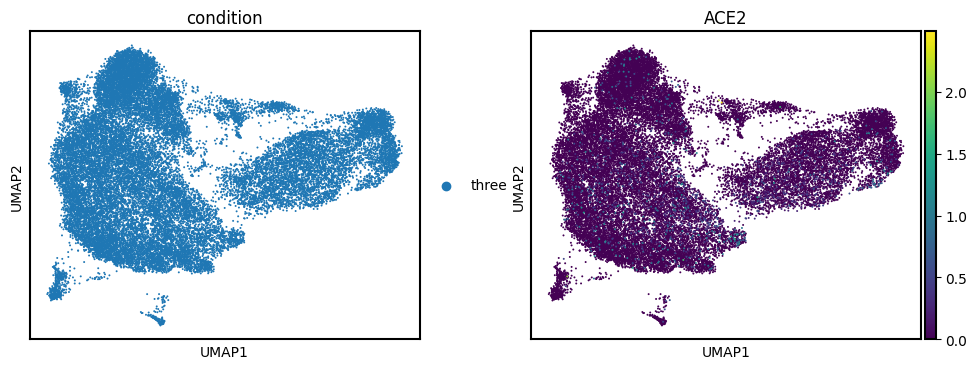

In [ ]:
sc.pl.umap(mock_adata, color=['condition', 'ACE2'], size=8)
sc.pl.umap(day_one, color=['condition', 'ACE2'], size=8)
sc.pl.umap(day_two, color=['condition', 'ACE2'], size=8)
sc.pl.umap(day_three, color=['condition', 'ACE2'], size=8)


In [ ]:
#mock
sc.tl.leiden(mock_adata, flavor="igraph", n_iterations=10, key_added="leiden_res_", resolution=0.25)

#day1
sc.tl.leiden(day_one, flavor="igraph", n_iterations=10, key_added="leiden_res_", resolution=0.25)

#day2
sc.tl.leiden(day_two, flavor="igraph", n_iterations=10, key_added="leiden_res_", resolution=0.25)

#day3
sc.tl.leiden(day_three, flavor="igraph", n_iterations=10, key_added="leiden_res_", resolution=0.25)


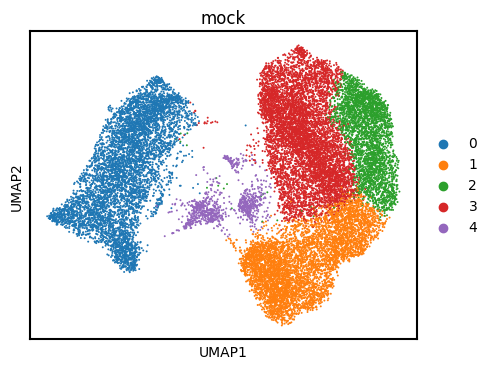

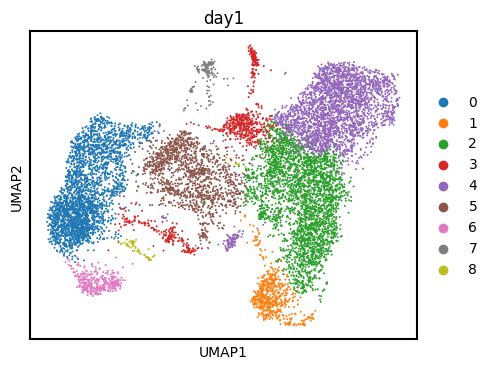

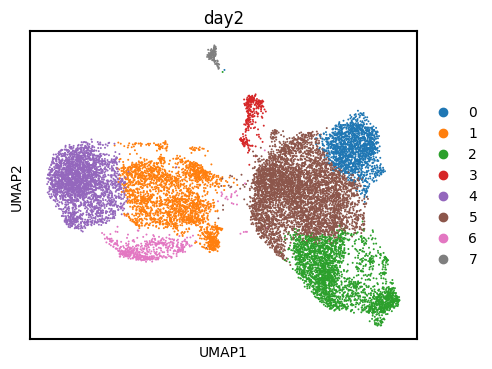

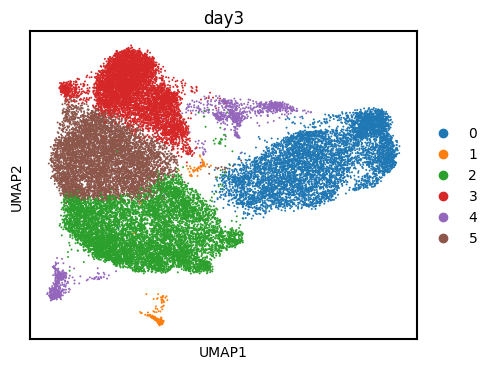

In [ ]:
sc.pl.umap(mock_adata, color=["leiden_res_"], size=8, title='mock')
sc.pl.umap(day_one, color=["leiden_res_"], size=8, title='day1')
sc.pl.umap(day_two, color=["leiden_res_"], size=8, title='day2')
sc.pl.umap(day_three, color=["leiden_res_"], size=8, title='day3')


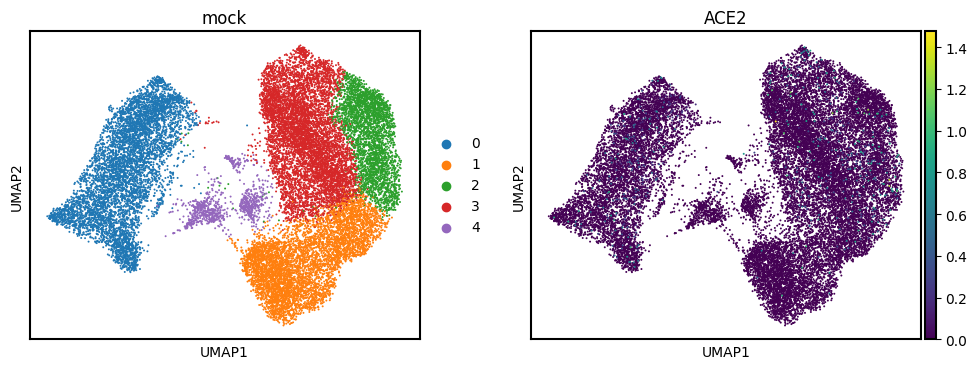

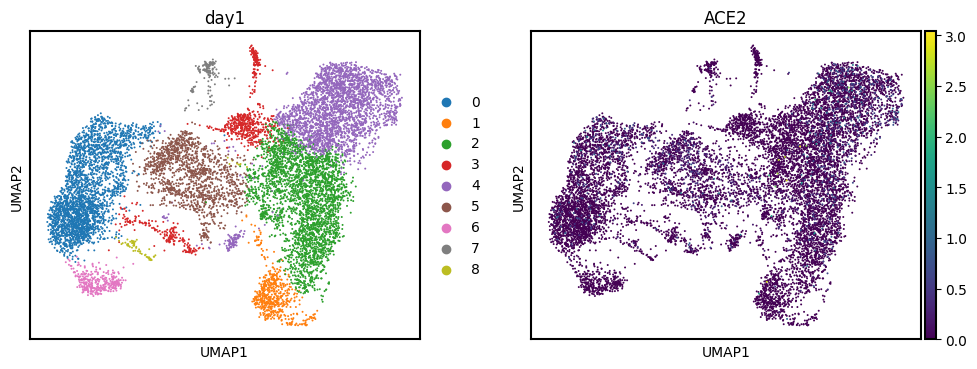

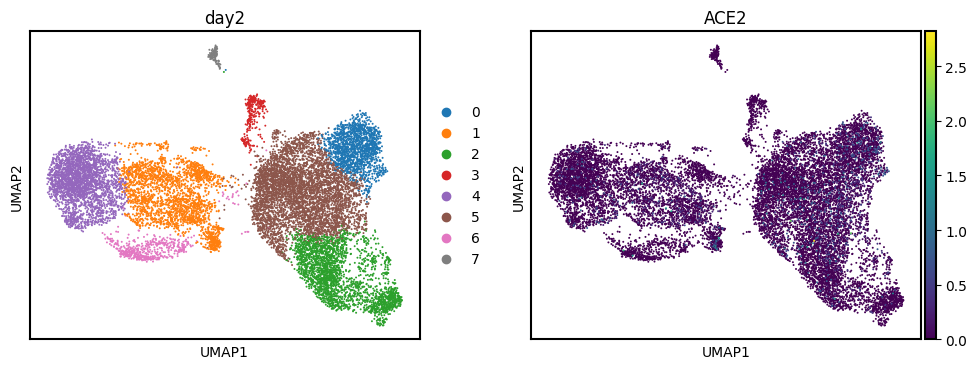

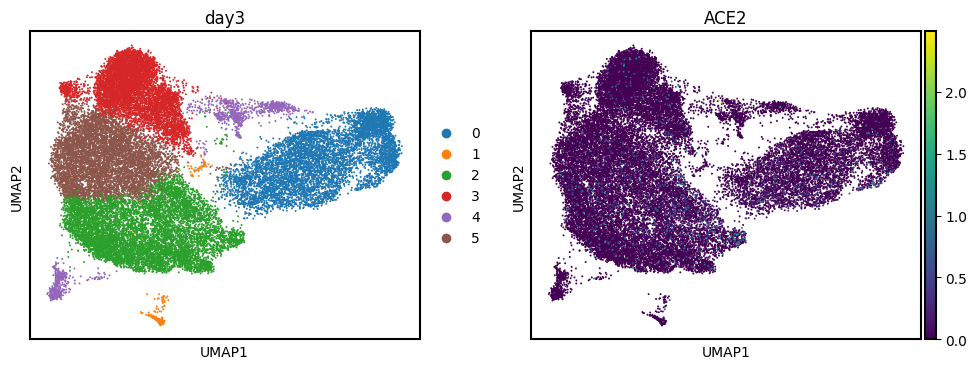

In [ ]:
sc.pl.umap(mock_adata, color=["leiden_res_", "ACE2"], size=8, title='mock')
sc.pl.umap(day_one, color=["leiden_res_", "ACE2"], size=8, title='day1')
sc.pl.umap(day_two, color=["leiden_res_", "ACE2"], size=8, title='day2')
sc.pl.umap(day_three, color=["leiden_res_", "ACE2"], size=8, title='day3')


Cell Annotation

In [ ]:
import decoupler as dc

In [ ]:
# Query Omnipath and get PanglaoDB
markers = dc.op.resource(name="PanglaoDB", organism="human")

In [ ]:
markers.head()

,genesymbol,canonical_marker,cell_type,germ_layer,human,human_sensitivity,human_specificity,mouse,mouse_sensitivity,mouse_specificity,ncbi_tax_id,organ,ubiquitiousness
,,,,,,,,,,,,,
0,A1CF,False,Hepatocytes,Endoderm,True,0.189189,0.004437,True,0.175000,0.000257,9606,Liver,0.002
1,A2APA5,False,Germ cells,Mesoderm,False,0.000000,0.000000,True,0.432927,0.000000,10090,Reproductive,0.004
2,A2M,True,Bergmann glia,Ectoderm,True,0.000000,0.062343,True,0.333333,0.001604,9606,Brain,0.012
3,A3FIN4,False,Mast cells,Mesoderm,False,0.000000,0.000000,True,0.184211,0.000708,10090,Immune system,0.001
4,A4GALT,True,Mast cells,Mesoderm,True,0.000000,0.014133,True,0.000000,0.003023,9606,Immune system,0.005


In [ ]:
markers.shape

(8211, 13)

In [ ]:
markers['organ'].unique()

array(['Liver', 'Reproductive', 'Brain', 'Immune system', 'Zygote',
       'Kidney', 'Blood', 'Lungs', 'Bone', 'GI tract', nan, 'Vasculature',
       'Pancreas', 'Heart', 'Mammary gland', 'Olfactory system',
       'Connective tissue', 'Epithelium', 'Skeletal muscle', 'Skin',
       'Embryo', 'Smooth muscle', 'Eye', 'Adrenal glands', 'Thyroid',
       'Placenta', 'Thymus', 'Parathyroid glands', 'Oral cavity',
       'Urinary bladder'], dtype=object)

In [ ]:
markers = markers[markers["organ"] == "Lungs"]

In [ ]:
markers.shape

(196, 13)

In [ ]:
# Remove duplicated entries
markers = markers[~markers.duplicated(["cell_type", "genesymbol"])]

# Format because dc only accepts cell_type and genesymbol

markers = markers.rename(columns={"cell_type": "source", "genesymbol": "target"})
markers = markers[["source", "target"]]


markers.head()

,source,target
,,
18,Pulmonary alveolar type II cells,ABCA3
31,Pulmonary alveolar type II cells,ABCD3
172,Pulmonary alveolar type II cells,ADGRF5
186,Airway epithelial cells,ADH7
222,Pulmonary alveolar type I cells,AGER


In [ ]:
import anndata as ad

# Create temporary AnnData objects with only highly variable genes for ULM
# and copy relevant metadata for downstream use (especially leiden_res_ and UMAP coordinates)
mock_adata_temp = mock_adata[:, mock_adata.var['highly_variable']].copy()
mock_adata_temp.obs = mock_adata.obs.copy()
mock_adata_temp.obsm['X_umap'] = mock_adata.obsm['X_umap'] # Copy UMAP coordinates

day_one_temp = day_one[:, day_one.var['highly_variable']].copy()
day_one_temp.obs = day_one.obs.copy()
day_one_temp.obsm['X_umap'] = day_one.obsm['X_umap']

day_two_temp = day_two[:, day_two.var['highly_variable']].copy()
day_two_temp.obs = day_two.obs.copy()
day_two_temp.obsm['X_umap'] = day_two.obsm['X_umap']

day_three_temp = day_three[:, day_three.var['highly_variable']].copy()
day_three_temp.obs = day_three.obs.copy()
day_three_temp.obsm['X_umap'] = day_three.obsm['X_umap']

# Run ULM on the temporary objects with highly variable genes
dc.mt.ulm(data=mock_adata_temp,
          net=markers,
          tmin=3)

dc.mt.ulm(data=day_one_temp,
          net=markers,
          tmin=3)

dc.mt.ulm(data=day_two_temp,
          net=markers,
          tmin=3)

dc.mt.ulm(data=day_three_temp,
          net=markers,
          tmin=3)

# Transfer the computed scores back to the original AnnData objects
mock_adata.obsm['score_ulm'] = mock_adata_temp.obsm['score_ulm']
day_one.obsm['score_ulm'] = day_one_temp.obsm['score_ulm']
day_two.obsm['score_ulm'] = day_two_temp.obsm['score_ulm']
day_three.obsm['score_ulm'] = day_three_temp.obsm['score_ulm']

In [ ]:
score_mock = dc.pp.get_obsm(mock_adata, key="score_ulm")

score_1 = dc.pp.get_obsm(day_one, key="score_ulm")

score_2 = dc.pp.get_obsm(day_two, key="score_ulm")

score_3 = dc.pp.get_obsm(day_three, key="score_ulm")

In [ ]:
#rank genes
#mock
mock_adata_gene_rank = dc.tl.rankby_group(score_mock, groupby="leiden_res_", reference="rest", method="t-test_overestim_var")
mock_adata_gene_rank = mock_adata_gene_rank[mock_adata_gene_rank["stat"] > 0]
mock_adata_gene_rank.head(5)

#day 1
one_adata_gene_rank = dc.tl.rankby_group(score_1, groupby="leiden_res_", reference="rest", method="t-test_overestim_var")
one_adata_gene_rank = one_adata_gene_rank[one_adata_gene_rank["stat"] > 0]
one_adata_gene_rank.head(5)

#day 2
two_adata_gene_rank = dc.tl.rankby_group(score_2, groupby="leiden_res_", reference="rest", method="t-test_overestim_var")
two_adata_gene_rank = two_adata_gene_rank[two_adata_gene_rank["stat"] > 0]
two_adata_gene_rank.head(5)

#day 3
three_adata_gene_rank = dc.tl.rankby_group(score_3, groupby="leiden_res_", reference="rest", method="t-test_overestim_var")
three_adata_gene_rank = three_adata_gene_rank[three_adata_gene_rank["stat"] > 0]
three_adata_gene_rank.head(5)

,group,reference,name,stat,meanchange,pval,padj
0,0,rest,Ciliated cells,142.046437,3.239963,0.000000,0.000000
3,0,rest,Airway goblet cells,4.666221,0.106908,0.000003,0.000004
4,0,rest,Pulmonary alveolar type II cells,0.630493,0.011622,0.528385,0.528385
8,1,rest,Ionocytes,2.116262,0.127816,0.035054,0.043818
10,2,rest,Airway goblet cells,93.139239,1.850135,0.000000,0.000000


In [ ]:
#mock
top_cell_type_per_group_mock = mock_adata_gene_rank.groupby('group')['name'].apply(lambda x: x.head(1))
display(top_cell_type_per_group_mock.to_dict())

#day 1
top_cell_type_per_group_1 = one_adata_gene_rank.groupby('group')['name'].apply(lambda x: x.head(1))
display(top_cell_type_per_group_1.to_dict())

#day 2
top_cell_type_per_group_2 = two_adata_gene_rank.groupby('group')['name'].apply(lambda x: x.head(1))
display(top_cell_type_per_group_2.to_dict())

#day 3
top_cell_type_per_group_3 = three_adata_gene_rank.groupby('group')['name'].apply(lambda x: x.head(1))
display(top_cell_type_per_group_3.to_dict())

{('0', 0): 'Clara cells',
 ('1', 7): 'Pulmonary alveolar type I cells',
 ('2', 14): 'Airway goblet cells',
 ('3', 23): 'Airway goblet cells',
 ('4', 30): 'Ionocytes'}

{('1', 5): 'Pulmonary alveolar type I cells',
 ('2', 10): 'Pulmonary alveolar type I cells',
 ('3', 15): 'Ionocytes',
 ('4', 20): 'Clara cells',
 ('5', 28): 'Airway goblet cells',
 ('8', 40): 'Pulmonary alveolar type II cells'}

{('0', 0): 'Pulmonary alveolar type II cells',
 ('1', 5): 'Ciliated cells',
 ('2', 12): 'Airway goblet cells',
 ('3', 15): 'Ionocytes',
 ('4', 20): 'Ciliated cells',
 ('5', 26): 'Airway goblet cells',
 ('6', 34): 'Ciliated cells',
 ('7', 37): 'Airway goblet cells'}

{('0', 0): 'Ciliated cells',
 ('1', 8): 'Ionocytes',
 ('2', 10): 'Airway goblet cells',
 ('3', 18): 'Alveolar macrophages',
 ('4', 20): 'Ionocytes',
 ('5', 28): 'Ionocytes'}

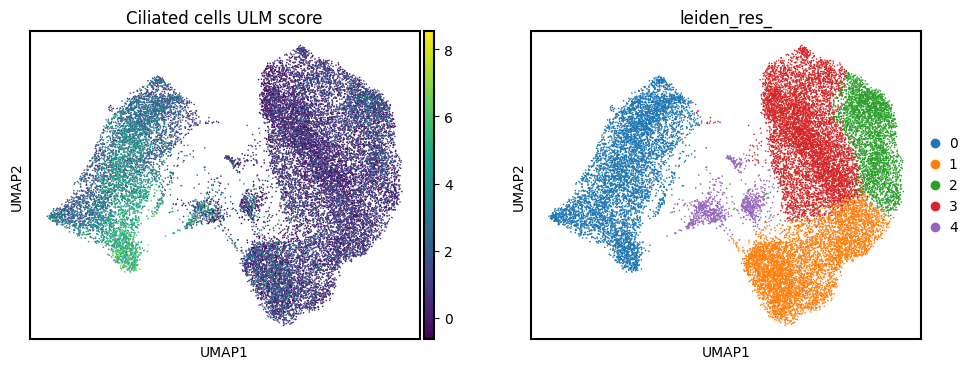

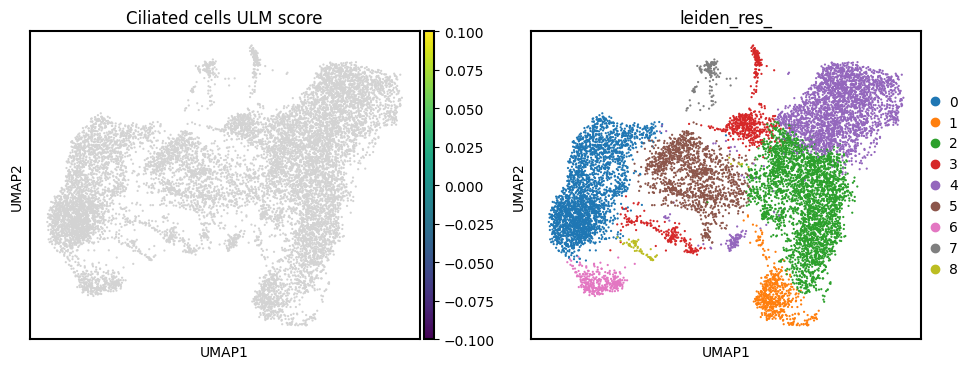

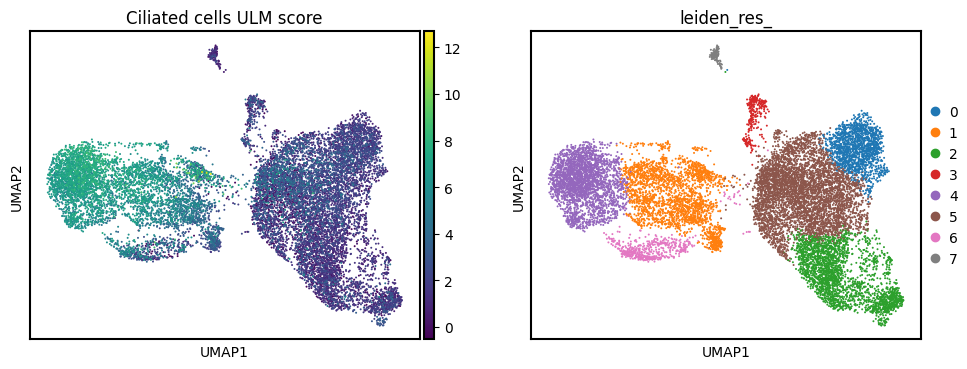

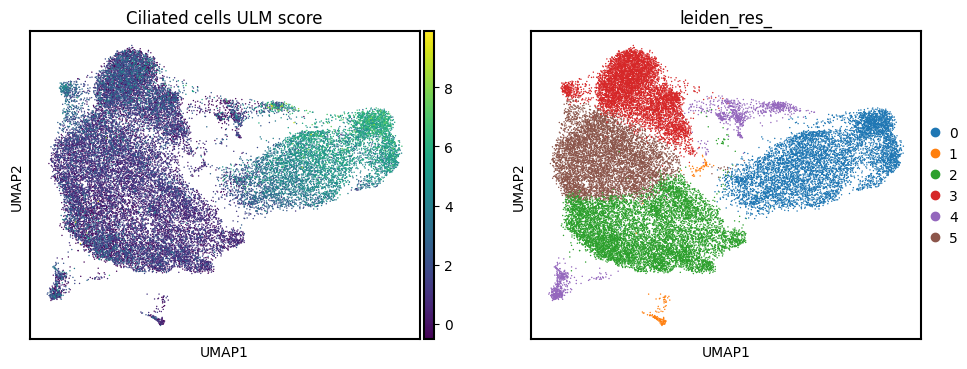

In [ ]:
# Add the ULM score for "Ciliated cells" to .obs for plotting
if 'Ciliated cells' in mock_adata.obsm['score_ulm'].columns:
    mock_adata.obs['Ciliated cells ULM score'] = mock_adata.obsm['score_ulm']['Ciliated cells']
else:
    mock_adata.obs['Ciliated cells ULM score'] = np.nan

if 'Ciliated cells' in day_one.obsm['score_ulm'].columns:
    day_one.obs['Ciliated cells ULM score'] = day_one.obsm['score_ulm']['Ciliated cells']
else:
    day_one.obs['Ciliated cells ULM score'] = np.nan

if 'Ciliated cells' in day_two.obsm['score_ulm'].columns:
    day_two.obs['Ciliated cells ULM score'] = day_two.obsm['score_ulm']['Ciliated cells']
else:
    day_two.obs['Ciliated cells ULM score'] = np.nan

if 'Ciliated cells' in day_three.obsm['score_ulm'].columns:
    day_three.obs['Ciliated cells ULM score'] = day_three.obsm['score_ulm']['Ciliated cells']
else:
    day_three.obs['Ciliated cells ULM score'] = np.nan

# Now plot both the ULM score and the renamed leiden_res_
sc.pl.umap(mock_adata, color=["Ciliated cells ULM score", "leiden_res_"])
sc.pl.umap(day_one, color=["Ciliated cells ULM score", "leiden_res_"])
sc.pl.umap(day_two, color=["Ciliated cells ULM score", "leiden_res_"])
sc.pl.umap(day_three, color=["Ciliated cells ULM score", "leiden_res_"])

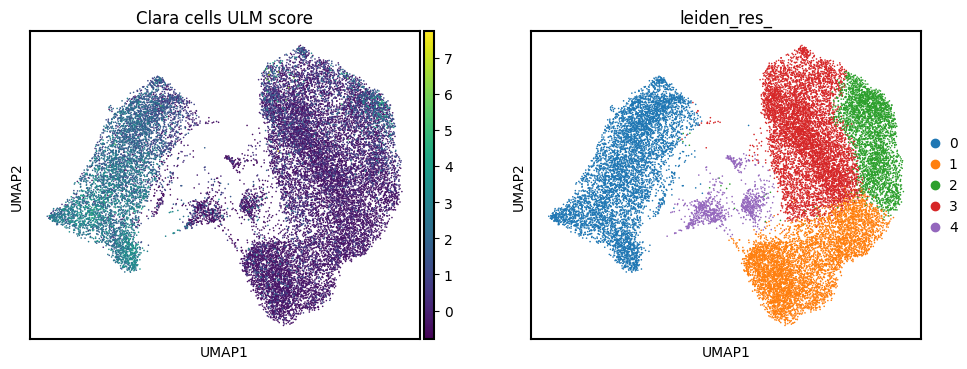

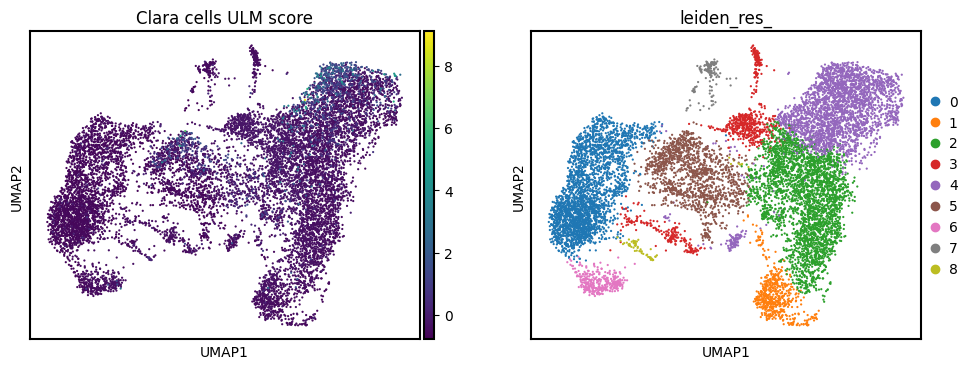

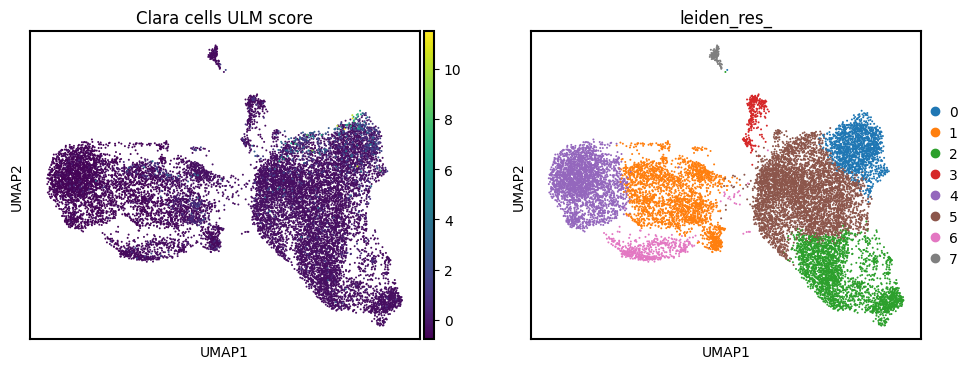

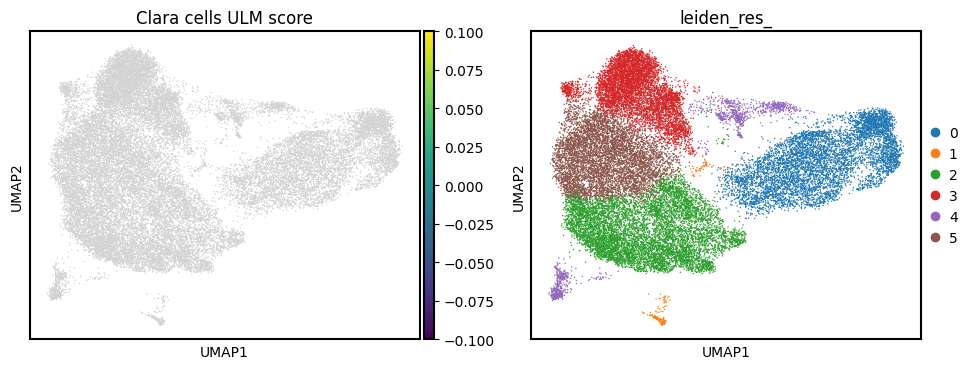

In [ ]:
# Add the ULM score for "Clara cells" to .obs for plotting
if 'Clara cells' in mock_adata.obsm['score_ulm'].columns:
    mock_adata.obs['Clara cells ULM score'] = mock_adata.obsm['score_ulm']['Clara cells']
else:
    mock_adata.obs['Clara cells ULM score'] = np.nan

if 'Clara cells' in day_one.obsm['score_ulm'].columns:
    day_one.obs['Clara cells ULM score'] = day_one.obsm['score_ulm']['Clara cells']
else:
    day_one.obs['Clara cells ULM score'] = np.nan

if 'Clara cells' in day_two.obsm['score_ulm'].columns:
    day_two.obs['Clara cells ULM score'] = day_two.obsm['score_ulm']['Clara cells']
else:
    day_two.obs['Clara cells ULM score'] = np.nan

if 'Clara cells' in day_three.obsm['score_ulm'].columns:
    day_three.obs['Clara cells ULM score'] = day_three.obsm['score_ulm']['Clara cells']
else:
    day_three.obs['Clara cells ULM score'] = np.nan

# Now plot both the ULM score and the renamed leiden_res_
sc.pl.umap(mock_adata, color=["Clara cells ULM score", "leiden_res_"])
sc.pl.umap(day_one, color=["Clara cells ULM score", "leiden_res_"])
sc.pl.umap(day_two, color=["Clara cells ULM score", "leiden_res_"])
sc.pl.umap(day_three, color=["Clara cells ULM score", "leiden_res_"])

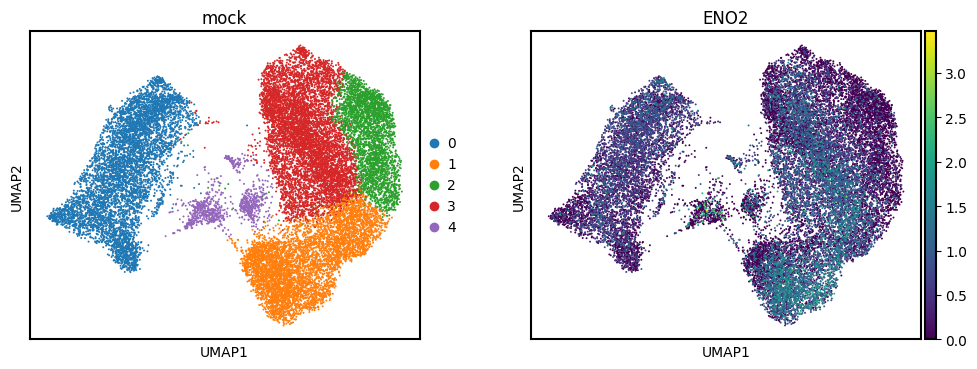

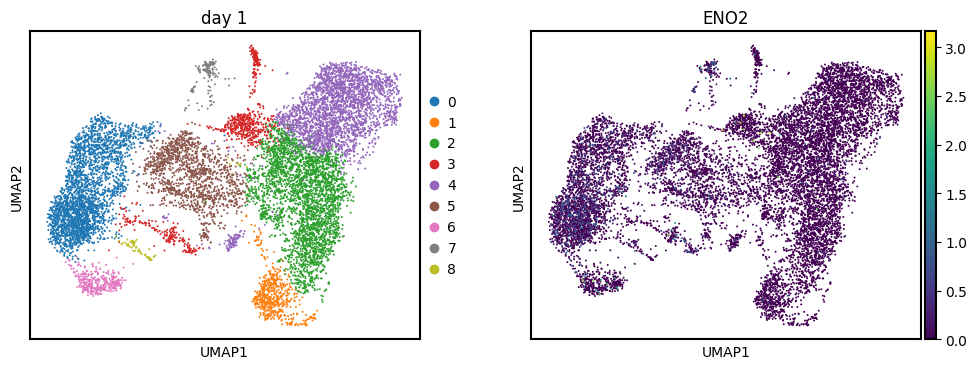

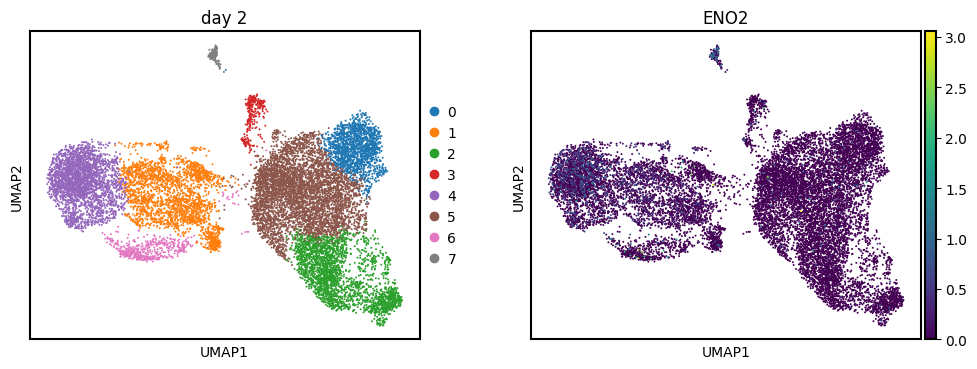

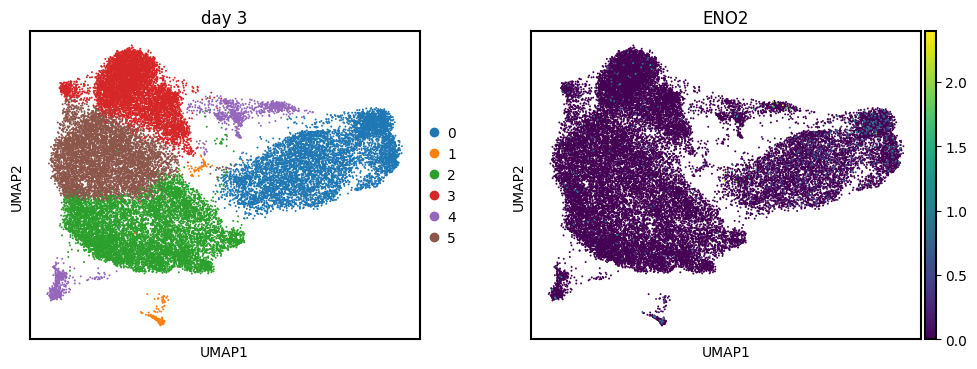

In [ ]:
sc.pl.umap(
    mock_adata,
    color=['leiden_res_', 'ENO2'],
    size=8,
    title= 'mock'
)

sc.pl.umap(
    day_one,
    color=['leiden_res_', 'ENO2'],
    size=8,
    title= 'day 1'
)

sc.pl.umap(
    day_two,
    color=['leiden_res_', 'ENO2'],
    size=8,
    title= 'day 2'
)

sc.pl.umap(
    day_three,
    color=['leiden_res_', 'ENO2'],
    size=8,
    title= 'day 3'
)

In [ ]:
dict_ann_m = mock_adata_gene_rank[mock_adata_gene_rank["stat"] > 0].groupby("group").head(1).set_index("group")["name"].to_dict()

dict_ann_1 = one_adata_gene_rank[one_adata_gene_rank["stat"] > 0].groupby("group").head(1).set_index("group")["name"].to_dict()

dict_ann_2 = two_adata_gene_rank[two_adata_gene_rank["stat"] > 0].groupby("group").head(1).set_index("group")["name"].to_dict()

dict_ann_3 = three_adata_gene_rank[three_adata_gene_rank["stat"] > 0].groupby("group").head(1).set_index("group")["name"].to_dict()

In [ ]:
mock_adata.obs["annotated_cell_type"] = mock_adata.obs["leiden_res_"].map(dict_ann_m)
day_one.obs["annotated_cell_type"] = day_one.obs["leiden_res_"].map(dict_ann_1)
day_two.obs["annotated_cell_type"] = day_two.obs["leiden_res_"].map(dict_ann_2)
day_three.obs["annotated_cell_type"] = day_three.obs["leiden_res_"].map(dict_ann_3)


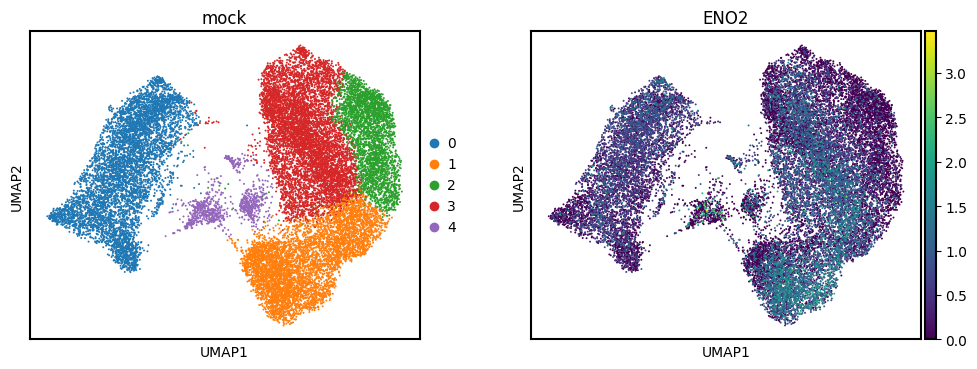

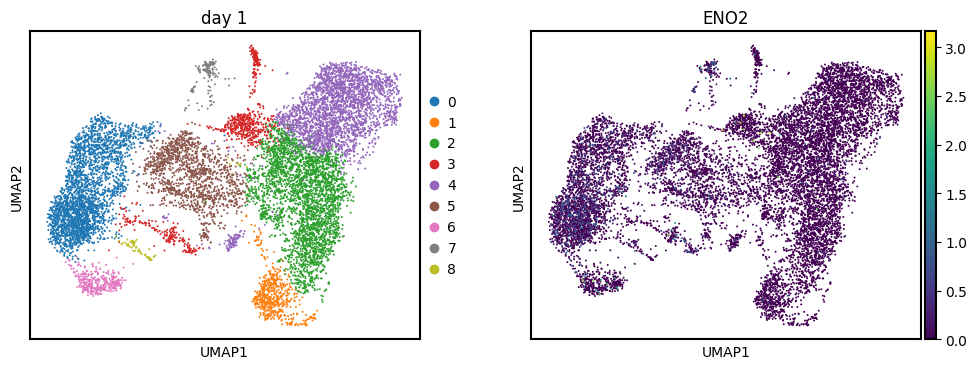

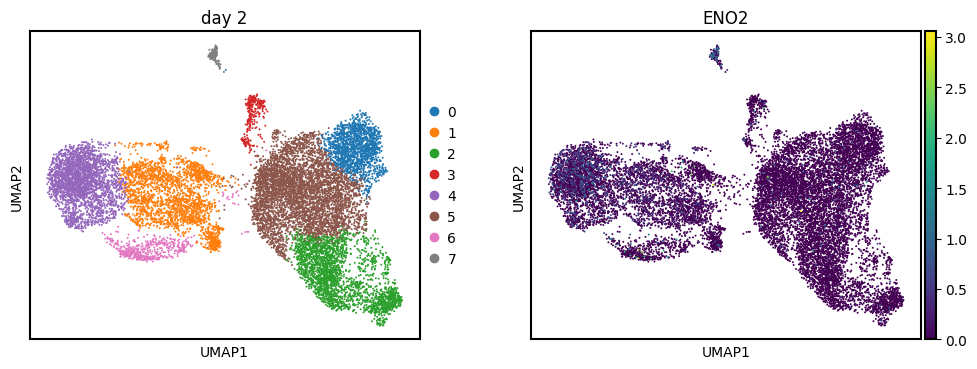

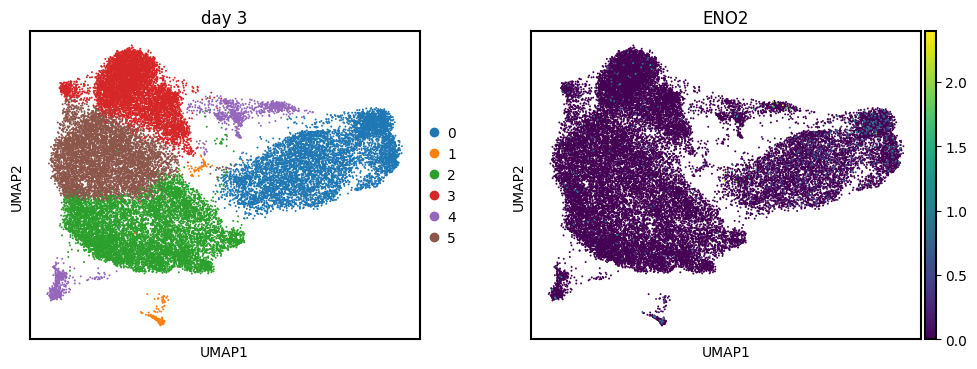

In [ ]:
sc.pl.umap(
    mock_adata,
    color=['leiden_res_', 'ENO2'],
    size=8,
    title= 'mock'
)

sc.pl.umap(
    day_one,
    color=['leiden_res_', 'ENO2'],
    size=8,
    title= 'day 1'
)

sc.pl.umap(
    day_two,
    color=['leiden_res_', 'ENO2'],
    size=8,
    title= 'day 2'
)

sc.pl.umap(
    day_three,
    color=['leiden_res_', 'ENO2'],
    size=8,
    title= 'day 3'
)

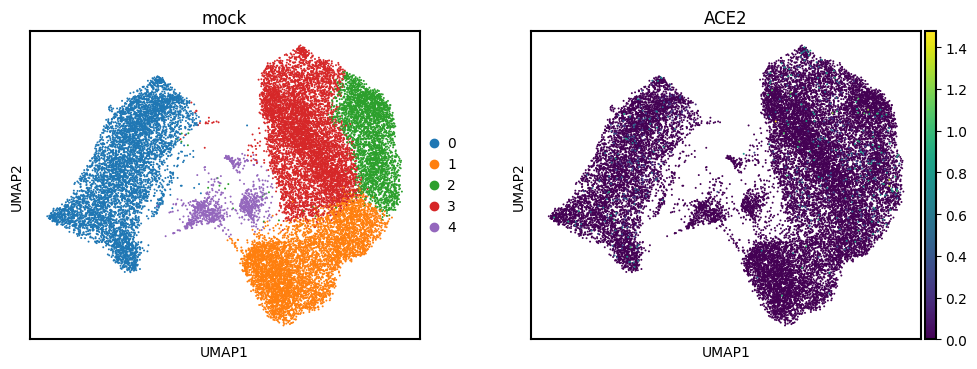

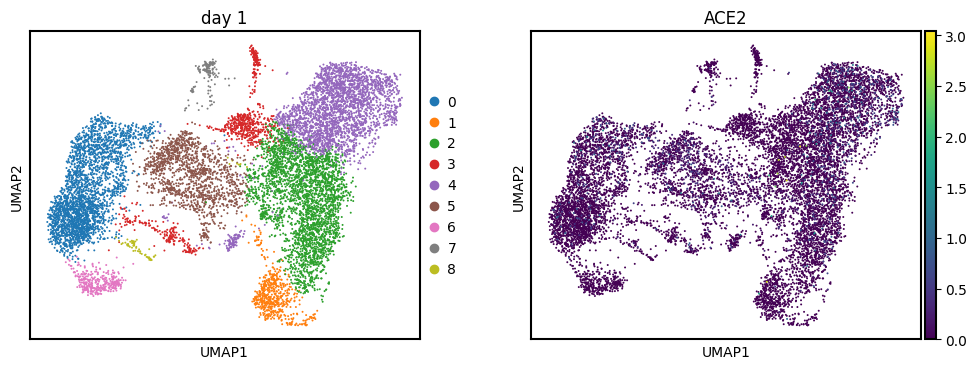

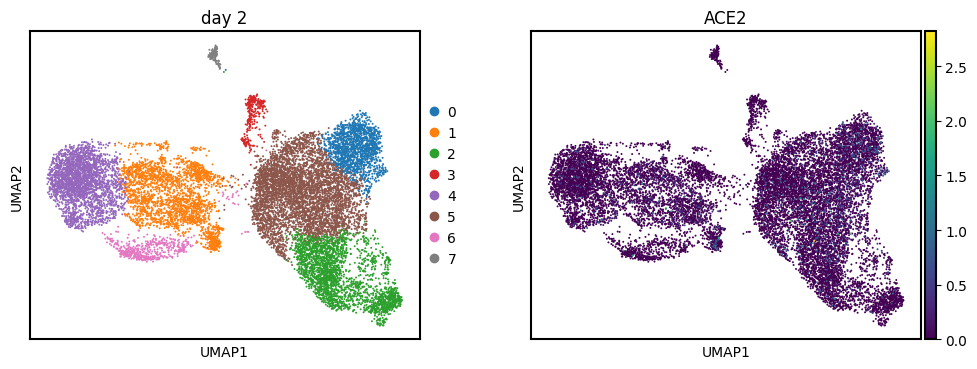

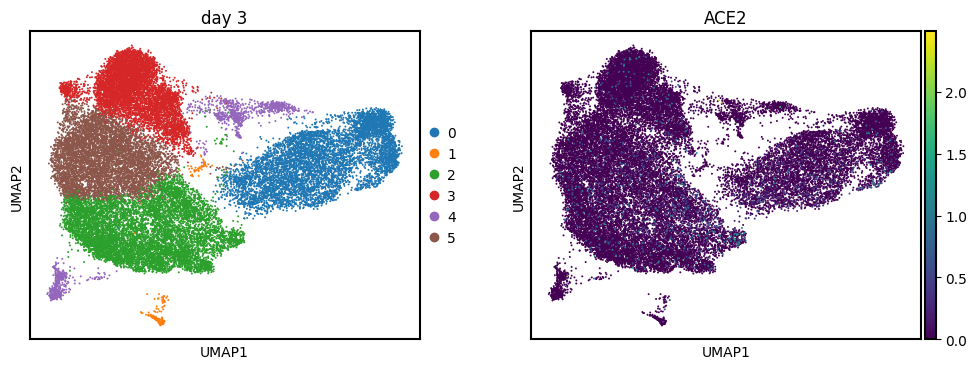

In [ ]:
sc.pl.umap(
    mock_adata,
    color=['leiden_res_', 'ACE2'],
    size=8,
    title= 'mock'
)

sc.pl.umap(
    day_one,
    color=['leiden_res_', 'ACE2'],
    size=8,
    title= 'day 1'
)

sc.pl.umap(
    day_two,
    color=['leiden_res_', 'ACE2'],
    size=8,
    title= 'day 2'
)

sc.pl.umap(
    day_three,
    color=['leiden_res_', 'ACE2'],
    size=8,
    title= 'day 3'
)

Trajectory Inference

In [ ]:
sc.tl.paga(mock_adata, groups='leiden_res_')
sc.tl.paga(day_one, groups='leiden_res_')
sc.tl.paga(day_two, groups='leiden_res_')
sc.tl.paga(day_three, groups='leiden_res_')

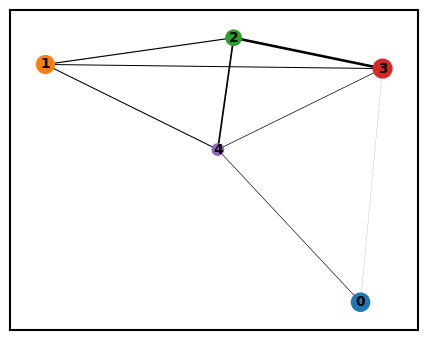

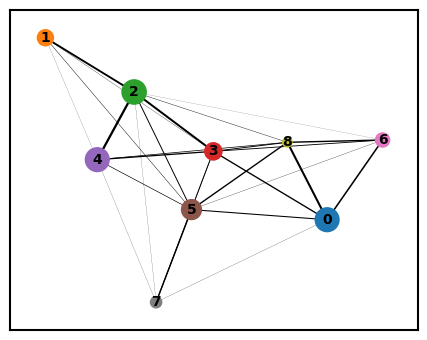

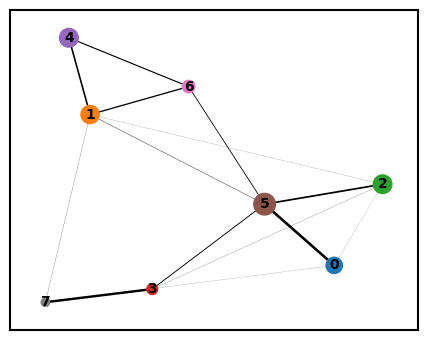

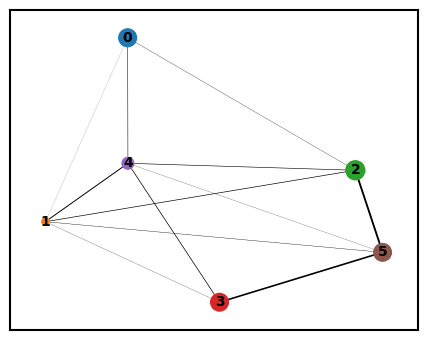

In [ ]:
sc.pl.paga(mock_adata, color='leiden_res_')
sc.pl.paga(day_one, color='leiden_res_')
sc.pl.paga(day_two, color='leiden_res_')
sc.pl.paga(day_three, color='leiden_res_')

In [ ]:
sc.tl.umap(mock_adata)
sc.tl.umap(day_one)
sc.tl.umap(day_two)
sc.tl.umap(day_three)

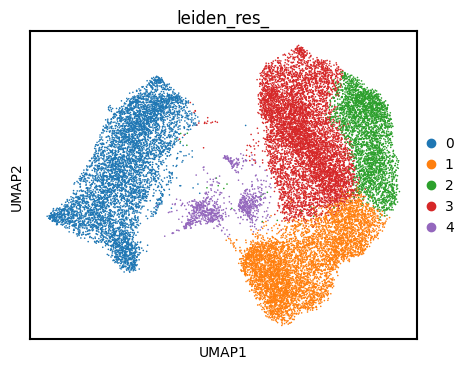

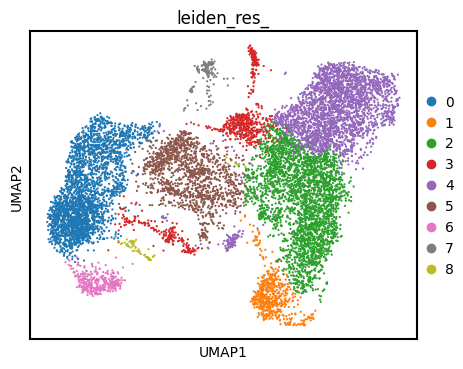

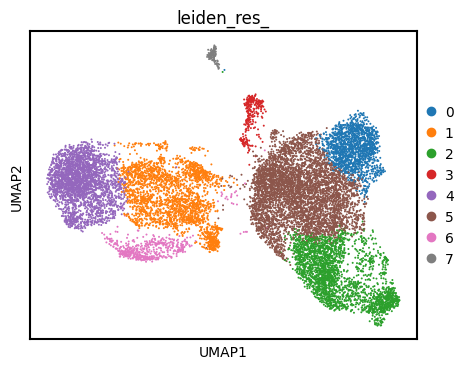

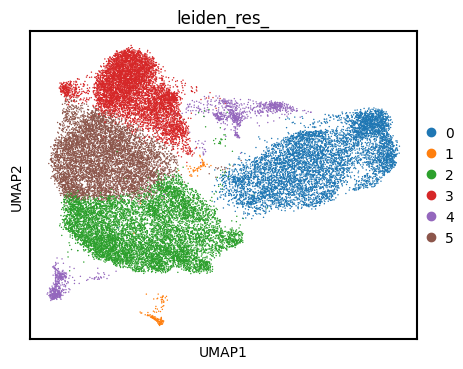

In [ ]:
sc.pl.umap(mock_adata, color='leiden_res_')
sc.pl.umap(day_one, color='leiden_res_')
sc.pl.umap(day_two, color='leiden_res_')
sc.pl.umap(day_three, color='leiden_res_')

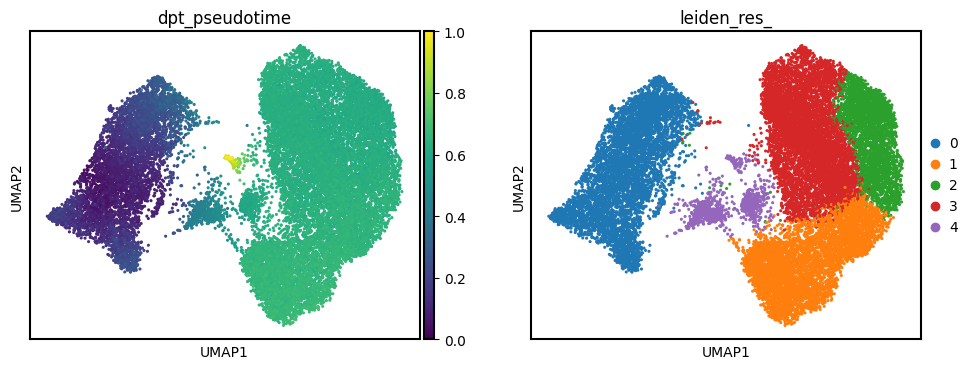

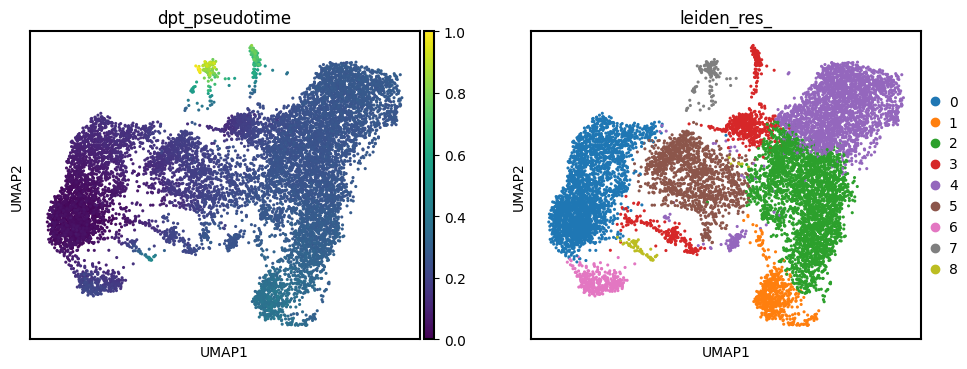

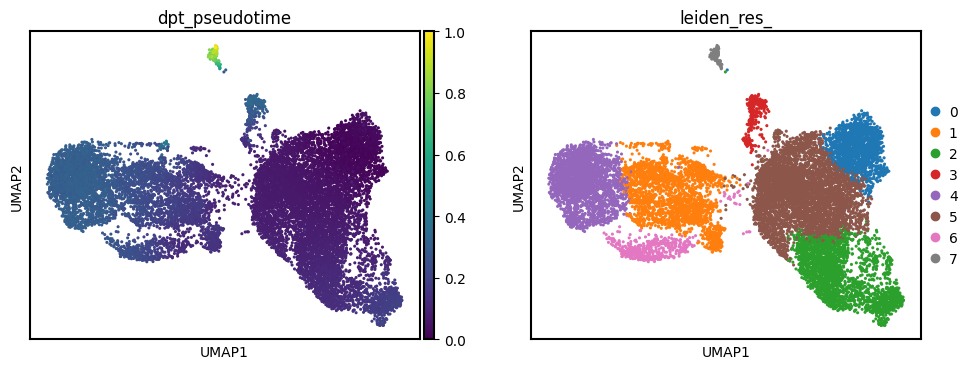

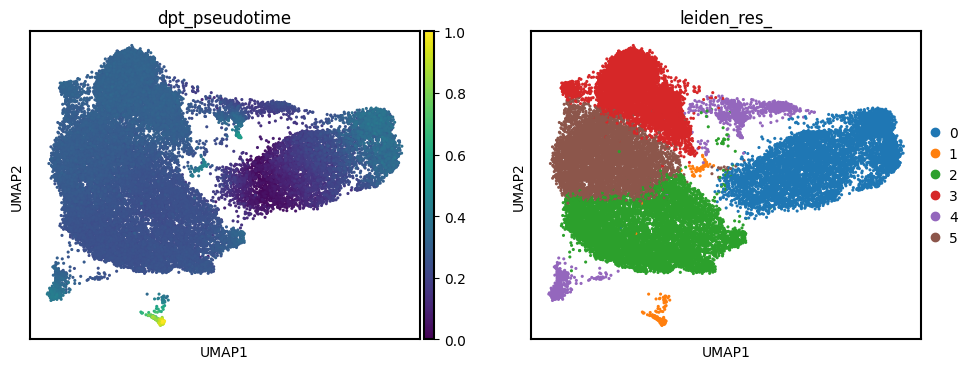

In [ ]:
def run_pseudotime(adata, root_cluster):
    import numpy as np
    import scanpy as sc

    # root cell assignment
    adata.uns['iroot'] = np.flatnonzero(adata.obs['leiden_res_'] == root_cluster)[0]

    # pseudotime
    sc.tl.dpt(adata)

    # plot pseudotime on UMAP
    sc.pl.umap(adata, color=['dpt_pseudotime', 'leiden_res_'], s=20)
    return adata

# run for all datasets
mock_adata = run_pseudotime(mock_adata, root_cluster='0')
day_one = run_pseudotime(day_one, root_cluster='0')
day_two = run_pseudotime(day_two, root_cluster='0')
day_three = run_pseudotime(day_three, root_cluster='0')


## Final Task

### Subtask:
Present the answers to all the questions in a clear and concise manner, synthesizing the information from the identified cell types, gene expressions, and biological context.


## Summary:

### Q&A

*   **Summarize Identified Cell Types per Stage:**
    *   **Mock (Uninfected) Stage:** Clara cells, Pulmonary alveolar type I cells, Airway goblet cells, Ionocytes.
    *   **Day 1 Post-Infection:** Pulmonary alveolar type I cells, Ionocytes, Clara cells, Airway goblet cells, Pulmonary alveolar type II cells.
    *   **Day 2 Post-Infection:** Pulmonary alveolar type II cells, Ciliated cells, Airway goblet cells, Ionocytes.
    *   **Day 3 Post-Infection:** Ciliated cells, Ionocytes, Airway goblet cells, Alveolar macrophages.

*   **Correlate Cell Types with COVID-19 Infection:**
    The identified lung cell types are highly relevant to COVID-19. Alveolar epithelial cells (Type I and Type II) are crucial for gas exchange, with AT2 cells expressing ACE2 for viral entry. Airway epithelial cells (Ciliated, Goblet, Clara, Ionocytes) are vital for mucociliary clearance and protection. Alveolar macrophages are immune cells critical for pathogen clearance. Disruption or infection of these cells by SARS-CoV-2 (especially ACE2-expressing ones) directly impacts lung function, immune response, and disease progression.

*   **Evaluate if ACE2 appears to be a good marker for tracking COVID-19 infection:**
    Yes, ACE2 appears to be a good marker for tracking COVID-19 infection in this dataset. Its expression pattern showed a dynamic change from low and scattered in the mock stage, to increasingly localized and intense in specific cell clusters by Day 3 post-infection, indicating its strong involvement in the infection process.

*   **Compare the expression patterns of ENO2 and ACE2 across all infection stages and discuss their roles as biomarkers:**
    ACE2 exhibits a dynamic and specific expression pattern, becoming progressively more localized and intense in specific cell clusters from Day 1 to Day 3 post-infection, directly correlating with its role as the viral entry receptor and making it a strong biomarker for infection progression. In contrast, ENO2 shows a broad and relatively stable expression across all stages, suggesting it acts as a general metabolic marker rather than a specific indicator of acute infection dynamics.

*   **Identify the highest ACE2 cluster at 3 dpi, correlate it with its annotated cell type, and provide a biological interpretation:**
    At 3 days post-infection, **Cluster 0** showed the highest abundance of ACE2 expression. This cluster is annotated as **Ciliated cells**. High ACE2 expression in Ciliated cells at 3 dpi is biologically significant, suggesting these cells are a primary site for viral entry and replication within the airways, contributing to impaired mucociliary clearance, localized inflammation, and the progression of respiratory symptoms characteristic of COVID-19.

### Data Analysis Key Findings

*   The cellular landscape of the lungs shifts significantly over the course of infection: Pulmonary alveolar type I cells are present in Mock and Day 1, while Pulmonary alveolar type II cells emerge from Day 1 and are prominent at Day 2. Ciliated cells become a dominant cell type from Day 2, and Alveolar macrophages appear at Day 3.
*   ACE2 expression, initially low and scattered in the mock stage, showed a clear and progressive increase in localization and intensity within specific cell clusters from Day 1 to Day 3 post-infection.
*   In contrast to ACE2, ENO2 expression remained broadly distributed and relatively stable across all infection stages, indicating its role as a general metabolic marker rather than an infection-specific biomarker.
*   At 3 days post-infection, **Ciliated cells (Cluster 0)** exhibited the highest expression of ACE2, indicating their significant involvement as a target for SARS-CoV-2 and a potential contributor to compromised mucociliary clearance and local inflammation.

### Insights or Next Steps

*   The dynamic shift in highly expressing ACE2 cells from early-stage alveolar cells to later-stage ciliated cells suggests a progression of viral tropism or an evolving cellular response, which warrants further investigation into the precise mechanisms driving this change.
*   Given the high ACE2 expression in Ciliated cells at 3 dpi, future research could focus on therapeutic strategies specifically targeting ciliated airway epithelial cells to reduce viral load, restore mucociliary function, and mitigate inflammation during the critical phase of COVID-19 infection.
